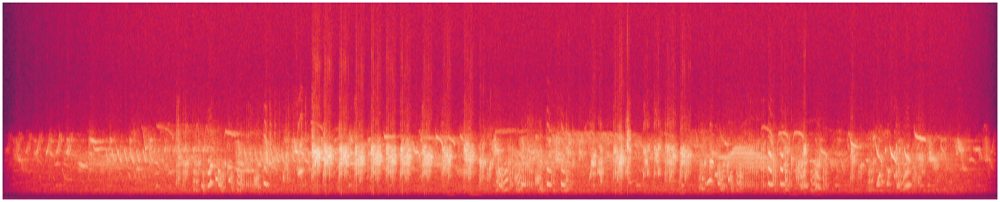

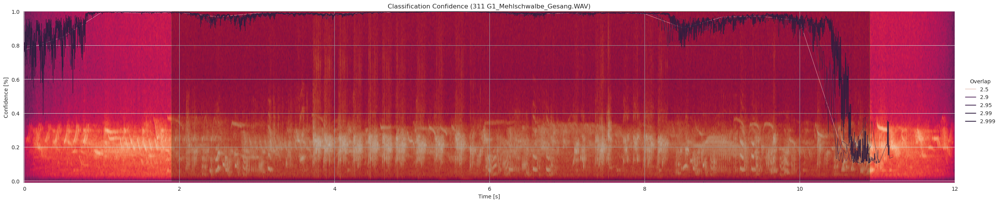

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 
import matplotlib.patches as patches

import os
import wave

import pylab
def graph_spectrogram(wav_file):
    sound_info, frame_rate = get_wav_info(wav_file)
    plt.figure(num=None, figsize=(50, 10))
    #plt.subplot(111)
    plt.specgram(sound_info, Fs=frame_rate)
    plt.axis('off')
    plt.savefig('spectrogram.png', bbox_inches='tight', pad_inches=0)
def get_wav_info(wav_file):
    wav = wave.open(wav_file, 'r')
    frames = wav.readframes(-1)
    sound_info = pylab.fromstring(frames, 'int16')
    frame_rate = wav.getframerate()
    wav.close()
    return sound_info, frame_rate

graph_spectrogram('testrun/311 G1_Mehlschwalbe_Gesang.WAV')

map_img = mpimg.imread('spectrogram.png') 

#sns.set_palette("vlag")
sns.set_style("whitegrid")
#map_img = mpimg.imread('s1_spectrogram.png') 
# load data from csv
df = pd.read_csv("testrun/18_08_2021-00:35:10-2.999_-0.75_0.1.csv")

# filtering for ground truth data
df_gt = df.loc[(df['Low_Freq'] == -1)]

# whole ds
df = df.loc[(df['Species_Code'] == 'cohmar1') & (df['Overlap'] != 0)]



bb_start = df_gt['Begin'].min()
bb_end = df_gt['Begin'].max()
bb_width = abs(float(bb_end) - float(bb_start))

# line plot
ln = sns.relplot(
    data=df,
    x="Begin",
    y="Confidence",
    hue='Overlap',
    kind="line",
    markers=False,
    aspect=5/1,
    linewidth=0.5
)
ln.set(xlabel="Time [s]", ylabel="Confidence [%]", title="Classification Confidence (311 G1_Mehlschwalbe_Gesang.WAV)")

rect = patches.Rectangle((bb_start, 0), bb_width, 1, linewidth=1, edgecolor='g', facecolor='k', alpha=0.25)

ln.set(ylim=(-0.01, 1))
plt.imshow(map_img, extent=[-0.01, 12, -0.01, 1.01], aspect='auto')
ln.axes[0, 0].add_patch(rect)
plt.show()